In [1]:
import sys

In [2]:
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np

scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

In [3]:
import warnings
warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)

In [4]:
import os
os.getcwd()

'/Volumes/groups/tanaka/People/current/jiwang/projects/RA_competence/scripts'

In [5]:
input_Dir = "../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.beforeRA.to.d6_rm.weired.clusters/"
outDir = "../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.beforeRA.to.d6_rm.weired.clusters/"

In [7]:
data_seuratObj = os.path.join(input_Dir, 
                              "RNAmatrix_umap_alevin.spliced_unspliced_RA_downsample_14k_rmCellCycle.correlatedGenes.h5ad")
adata = sc.read_h5ad(data_seuratObj, chunk_size=6000)

In [8]:
adata

AnnData object with n_obs × n_vars = 14000 × 15157
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features'
    obsm: 'X_umap'
    layers: 'spliced', 'unspliced'

In [9]:
adata.layers.keys()

KeysView(Layers with keys: spliced, unspliced)

In [10]:
adata.obs['condition']= adata.obs['condition'].astype('category') # change the condition into category type
adata.obs['celltypes']= adata.obs['celltypes'].astype('category')
adata.obs['clusters']= adata.obs['clusters'].astype('category')

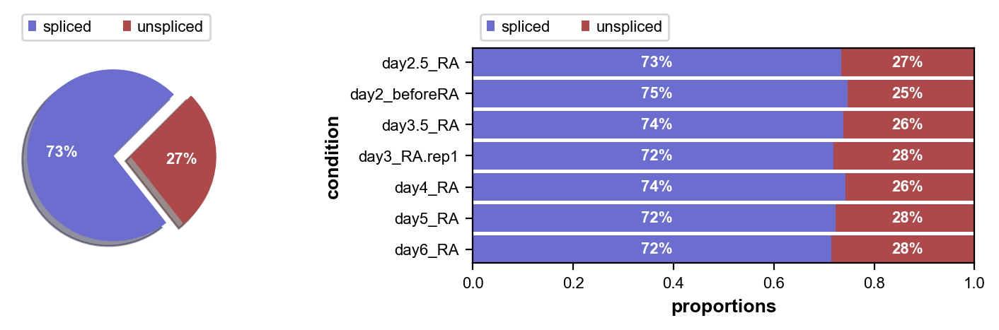

In [11]:
#adata = cr.datasets.pancreas()

scv.pl.proportions(adata, groupby='condition')


In [12]:
scv.pp.filter_and_normalize(adata, 
                            min_shared_counts=20, n_top_genes=3000, 
                            flavor = 'seurat', 
                            layers_normalize={'X', 'spliced', 'unspliced'}) # by specifying layers_normalize to renormalize the counts 
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=30)
scv.pp.moments(adata, n_pcs=None, n_neighbors=None)

Filtered out 4352 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 3000 highly variable genes.


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


computing moments based on connectivities
    finished (0:00:05) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [13]:
scv.tl.recover_dynamics(adata, n_jobs=10, max_iter=10) # slow step and require high memory ~120G, so it is better to start the jupterlab with 150G RAM (~15-20mins)

recovering dynamics (using 10/10 cores)
or disable the progress bar using `show_progress_bar=False`.
    finished (0:04:36) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [14]:
adata 

AnnData object with n_obs × n_vars = 14000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling'
    uns: 'pca', 'neighbors', 'recover_dynamics'
    obsm: 'X_umap', 'X_pca'
    var

In [15]:
# save the velocity result
#adata.write(os.path.join(outDir,'my_results_6k.cells_velocity_recover_dynamics.h5ad'), compression="gzip")

In [16]:
# reload the calculated velocity from tl.recover_dynamics
#adata = sc.read_h5ad(os.path.join(outDir,'my_results_6k.cells_velocity_recover_dynamics.h5ad'), chunk_size=6000)

In [17]:
scv.tl.velocity(adata, mode="dynamical")

computing velocities
    finished (0:00:12) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


computing velocity graph (using 1/10 cores)
    finished (0:00:23) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


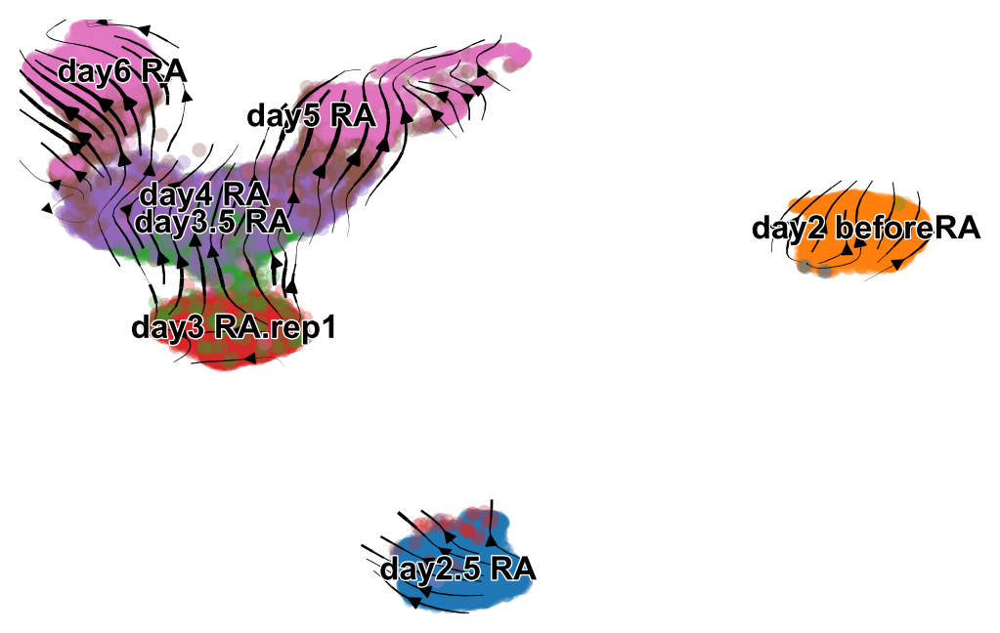

In [18]:
scv.tl.velocity_graph(adata, approx = None, sqrt_transform = None)
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

figure cannot be saved as pdf, using png instead.
saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.beforeRA.to.d6_rm.weired.clusters/RNAvelocity_stream_model_dynamical_stream_top3000.png


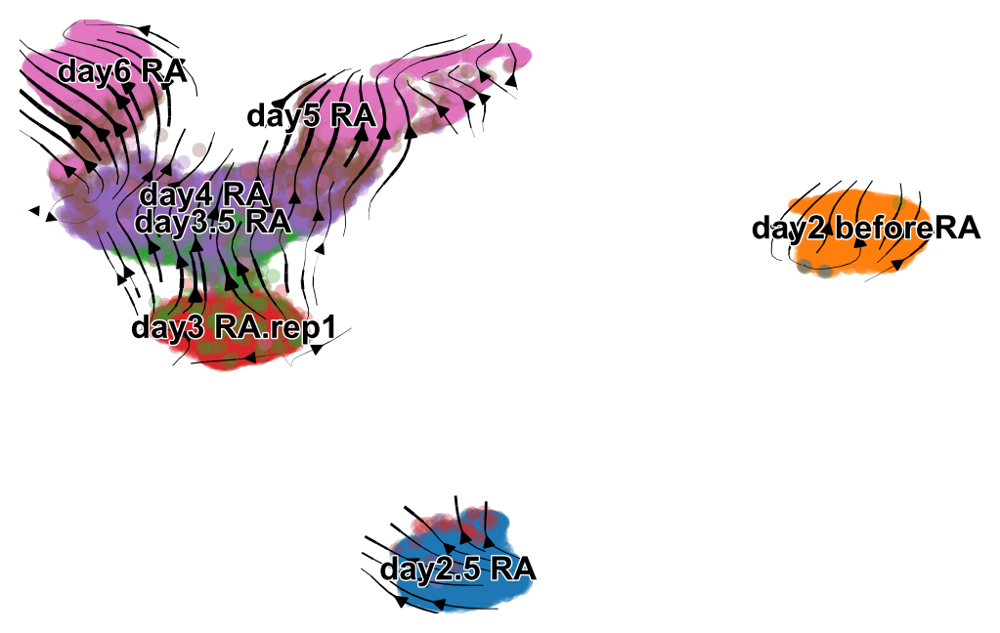

In [19]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.6, min_mass=1,
    legend_fontsize=12, title="", color = "condition", 
    save=os.path.join(outDir, "RNAvelocity_stream_model_dynamical_stream_top3000.pdf"))

In [20]:
#scv.tl.velocity(adata, mode="stochastic")
scv.tl.velocity(adata, mode="steady_state")

computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


computing velocity graph (using 1/10 cores)
    finished (0:00:24) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


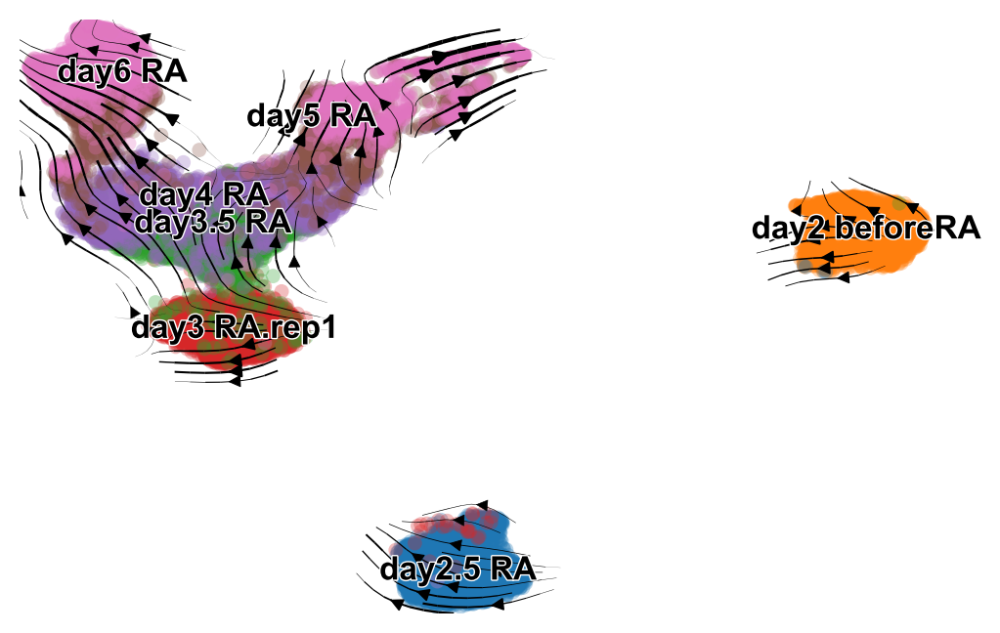

In [21]:
scv.tl.velocity_graph(adata, approx = None, sqrt_transform = None)
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.6, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

figure cannot be saved as pdf, using png instead.
saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.beforeRA.to.d6_rm.weired.clusters/RNAvelocity_stream_model_steadystat_stream_top3000.png


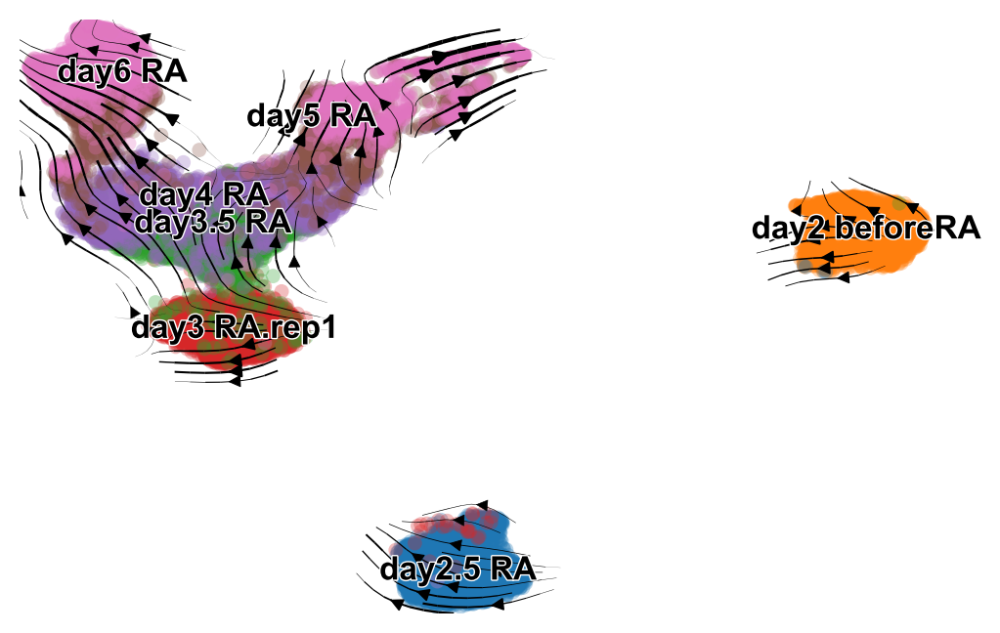

In [22]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.6, min_mass=1,
    legend_fontsize=12, title="", color = "condition", 
    save=os.path.join(outDir, "RNAvelocity_stream_model_steadystat_stream_top3000.pdf"))

computing velocities
    finished (0:00:06) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/10 cores)
    finished (0:00:56) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


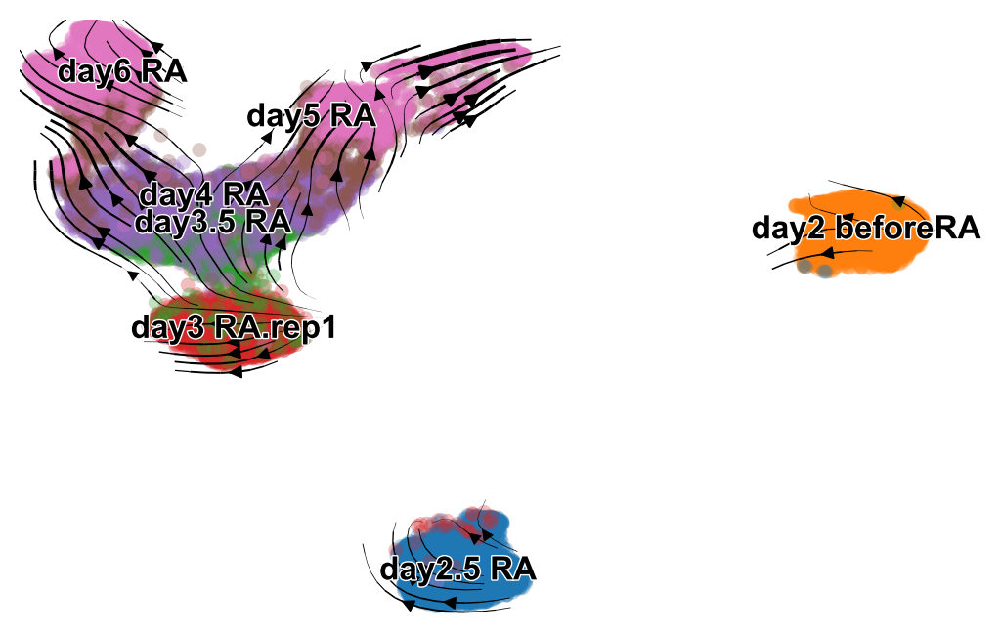

In [23]:
scv.tl.velocity(adata, mode="stochastic")
scv.tl.velocity_graph(adata)
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.beforeRA.to.d6_rm.weired.clusters/RNAvelocity_model_stochastic_stream_top3000.pdf


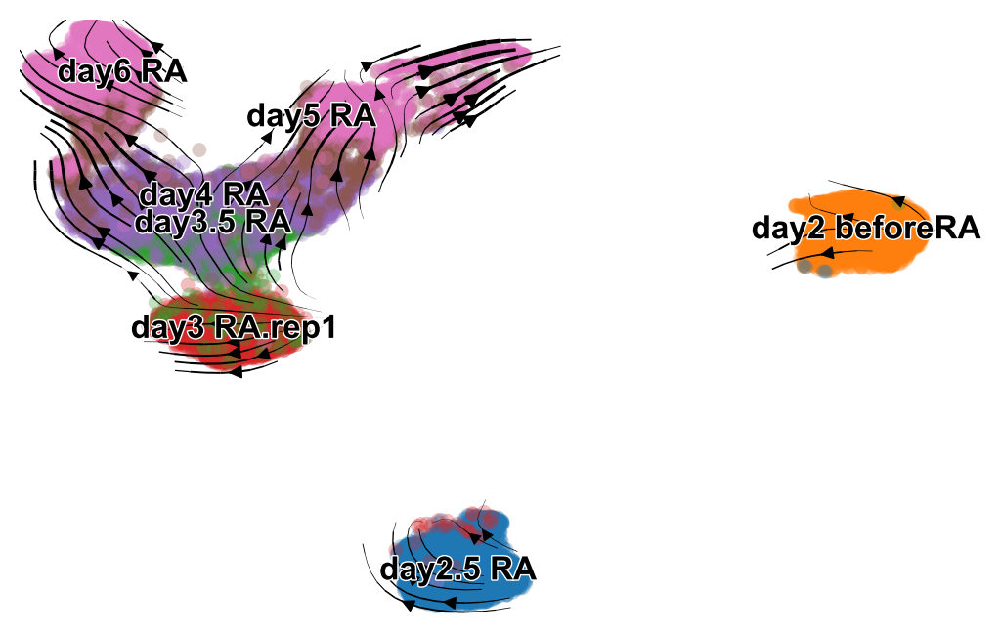

In [24]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "condition", 
    save=os.path.join(outDir, "RNAvelocity_model_stochastic_stream_top3000.pdf"))

In [25]:
# compare three models and it seems that the steady state works relatively better for root and terminal cells

In [26]:
#scv.tl.velocity(adata, mode="dynamical") # test dynamical model
#scv.tl.velocity(adata, mode="steady_state")
scv.tl.velocity(adata, mode="stochastic") # test dynamical model
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/10 cores)
    finished (0:00:16) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


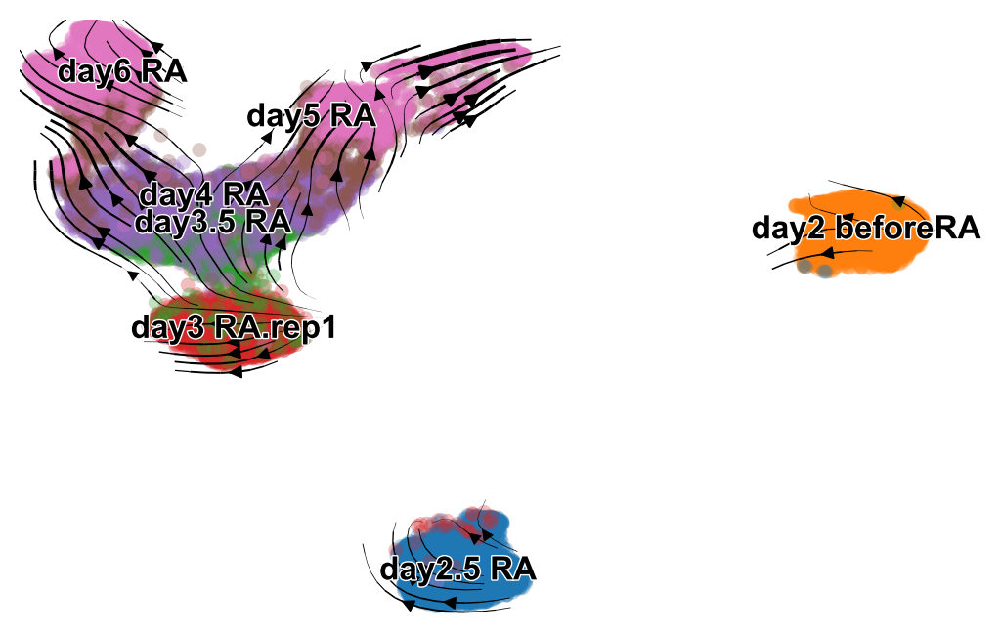

In [25]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

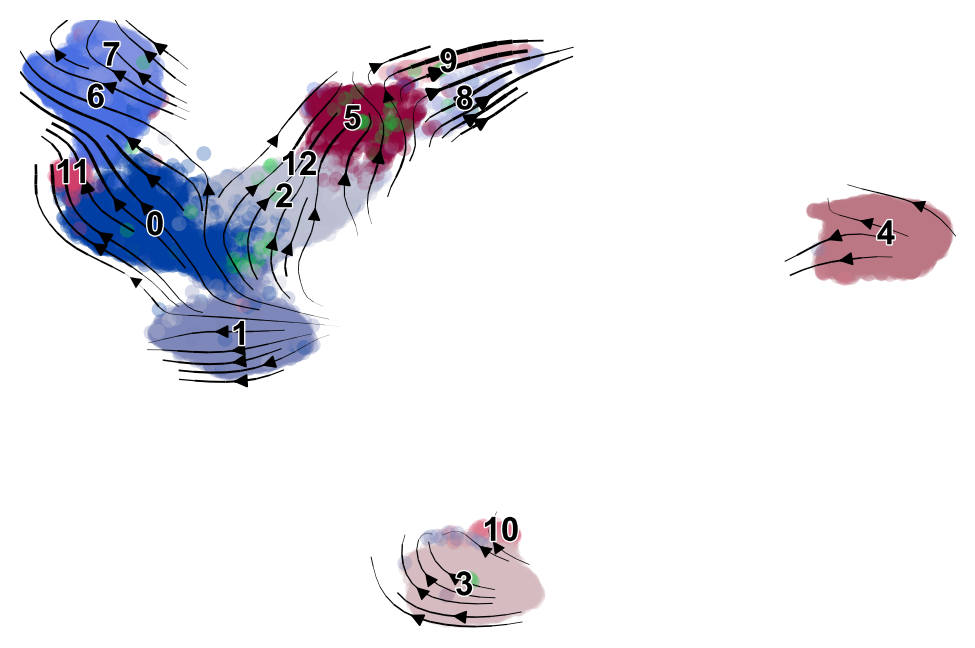

In [26]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "clusters"
)

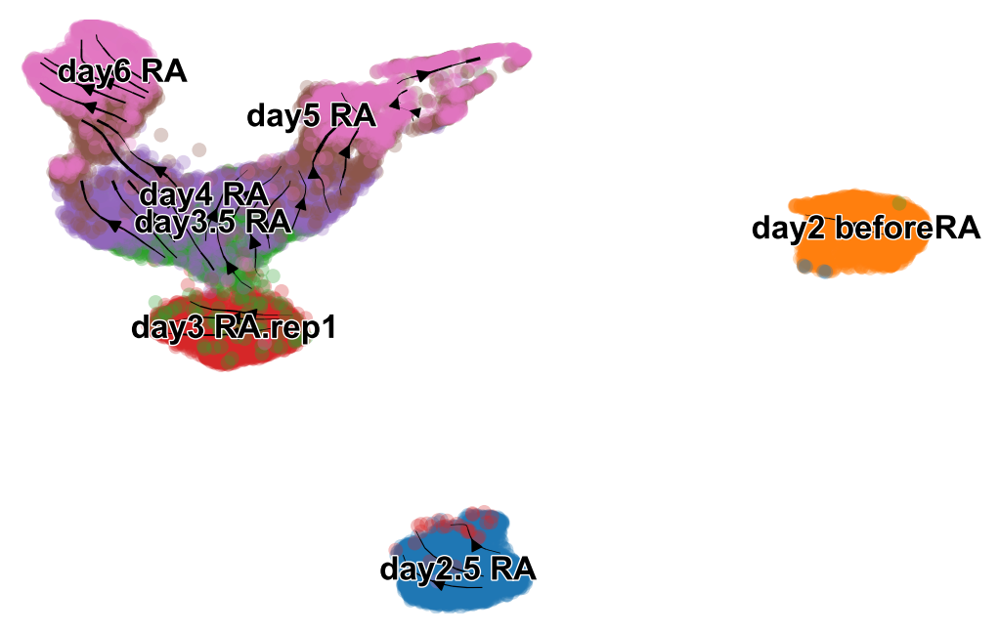

In [27]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.1, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

In [28]:
adata

AnnData object with n_obs × n_vars = 14000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes', 'velocity_gamma', 'velocity_qreg_rat

computing velocity embedding
    finished (0:00:05) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)


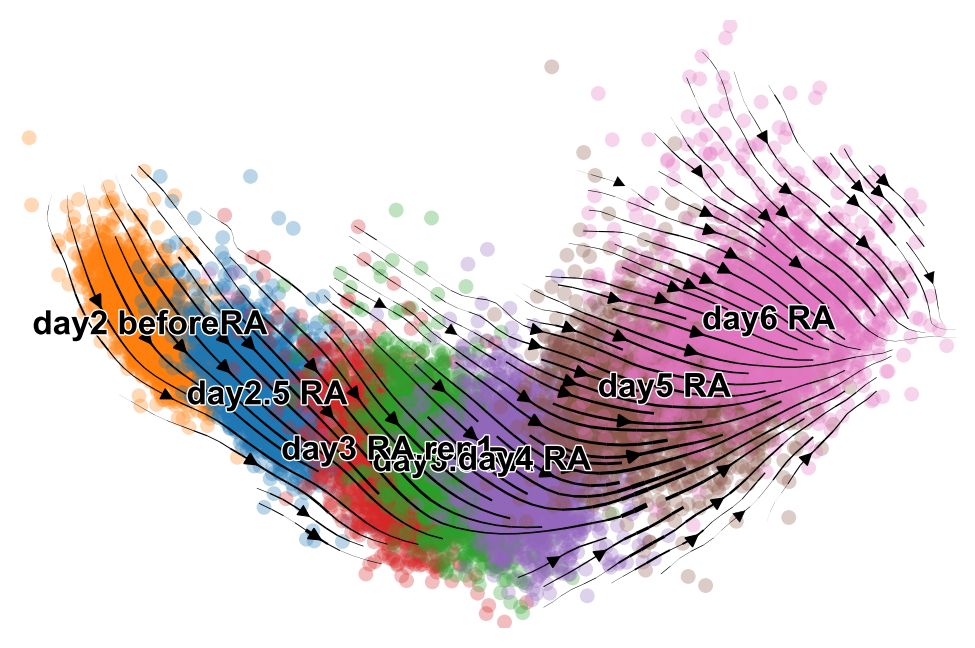

In [29]:
scv.pl.velocity_embedding_stream(
    adata, basis="pca", smooth=0.4, min_mass=0.5,
    legend_fontsize=12, title="", color = "condition"
)

In [30]:
print(adata.var.velocity_genes.sum()) # check the genes used for RNA velocity

1391


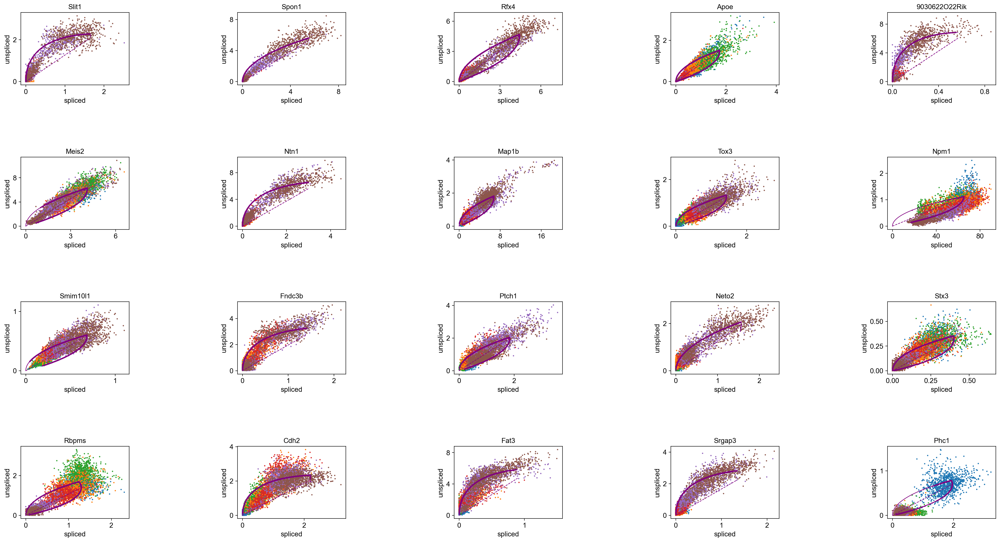

In [33]:
## top genes
top_genes = adata.var.sort_values('fit_likelihood', ascending=False).index[:20]
scv.pl.scatter(adata, basis=top_genes, color="condition", wspace=1, hspace=1, nrows=4, ncols=5)

In [40]:
# scv.pl.velocity_embedding(adata, basis="umap", arrow_length=3, arrow_size=2, dpi=120, color = "condition")
# scv.pl.velocity_embedding(adata, basis='umap',color='cell.type.fine',arrow_length=5)
# scv.pl.velocity_embedding_grid(adata, basis='umap',color='seurat_clusters',arrow_length=5)

In [41]:
#####latent time
#scv.tl.terminal_states(adata)
#scv.tl.latent_time(adata)
#scv.pl.scatter(adata, color='latent_time',color_map='gnuplot', size=80)
#scv.pl.scatter(adata, color=[ 'root_cells', 'end_points'])

In [31]:
# save the scvelo result
adata
adata.write(os.path.join(outDir,'my_results_14k.cells_scvelo_stochastic.h5ad'), compression="gzip")

In [60]:
scv.tl.terminal_states(adata)

computing terminal states
    identified 4 regions of root cells and 2 regions of end points .
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


In [61]:
scv.tl.latent_time(adata)

computing latent time using root_cells as prior
    finished (0:00:04) --> added 
    'latent_time', shared time (adata.obs)


In [62]:
adata

AnnData object with n_obs × n_vars = 14000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'clusters_gradients', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'terminal_states', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likeli

In [38]:
################# 
# Run CellRank using basic functions -- https://cellrank.readthedocs.io/en/stable/cellrank_basics.html
#################

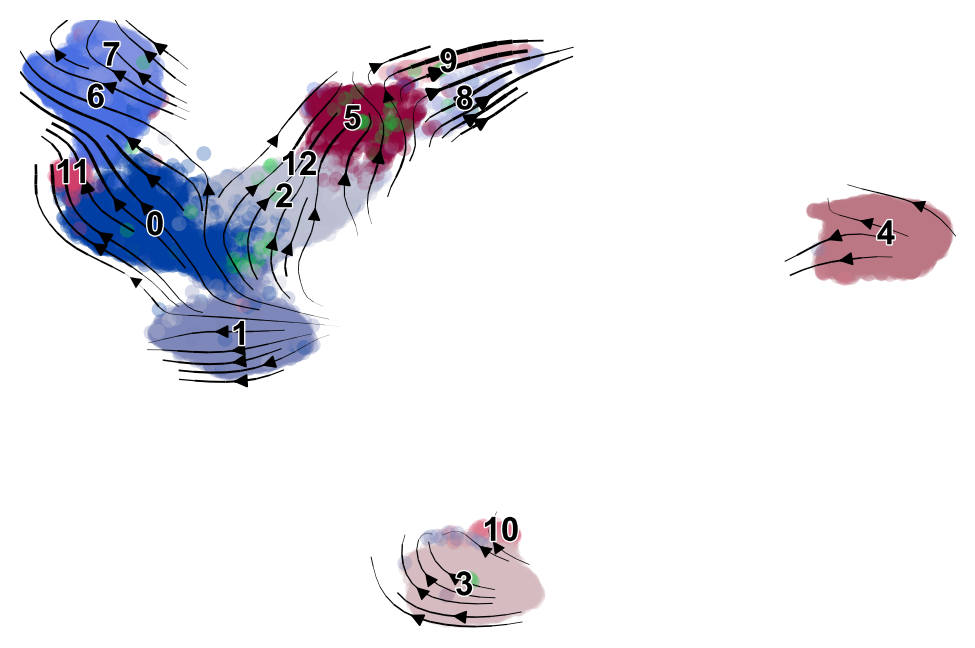

In [32]:
adata
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "clusters"
)

In [33]:
# Identify terminal states
# it did not work well, see issue in https://github.com/theislab/cellrank/issues/399
cr.tl.terminal_states(adata, 
                      n_states = 2, 
                      cluster_key="clusters", 
                      weight_connectivities=0.2, 
                      force_recompute = True)

/Users/jingkui.wang/anaconda3/envs/cellrank/lib/python3.7/site-packages/ipykernel_launcher.py:7: DeprecationWarning: `cellrank.tl.terminal_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  import sys
/Users/jingkui.wang/anaconda3/envs/cellrank/lib/python3.7/site-packages/cellrank/tl/_init_term_states.py:161: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  **kwargs,


Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14000/14000 [01:39<00:00, 140.20cell/s]

Setting `softmax_scale=15.8728`



100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14000/14000 [01:39<00:00, 140.57cell/s]


    Finish (0:03:21)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing Schur decomposition
Mat Object: 1 MPI processes
  type: seqdense
1.0000000000000084e+00 -2.6824522334355093e-03 9.0771612021361518e-03 1.4668597946010064e-02 -1.0160568501587830e-02 -6.8821455065238100e-03 
0.0000000000000000e+00 9.9335006958952798e-01 -5.2137782183730936e-03 -1.2421672622422933e-02 4.0735451075620812e-04 1.2307405719705954e-03 
0.0000000000000000e+00 0.0000000000000000e+00 9.9307163540548560e-01 -4.6285004132957733e-03 -5.2420124768320633e-03 -9.8629596425189522e-03 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 9.7893706921934431e-01 -3.2180586742682163e-02 -1.5701511002375507e-02 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 9.6648617190026476e-01 -3.8803782994830359e-02 
0.0000000000000000e+00 0.0000000000000000e+00 0.000000000000000

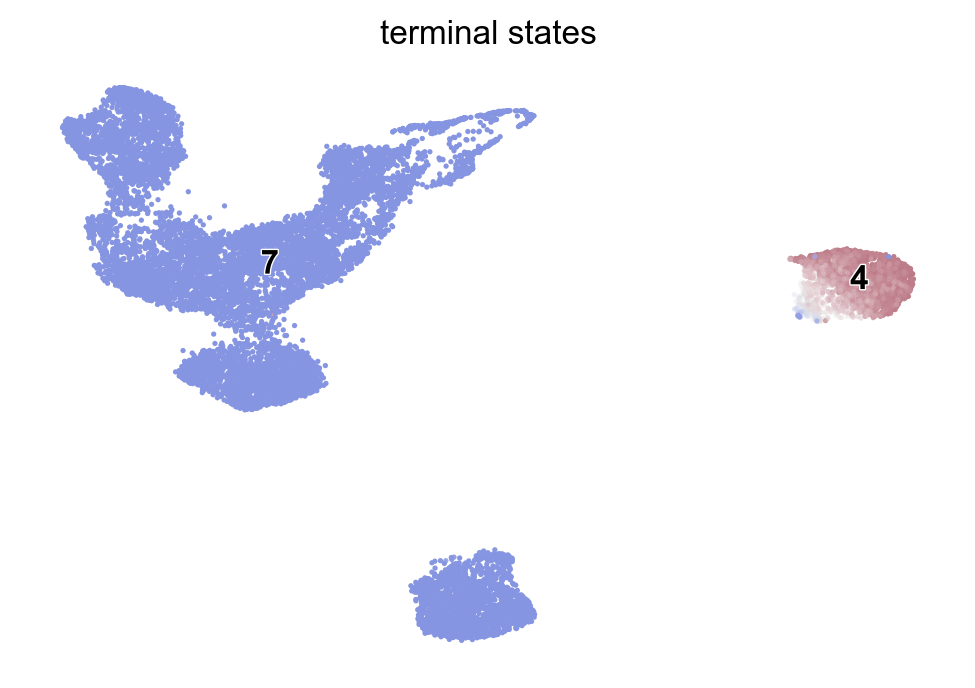

In [34]:
cr.pl.terminal_states(adata)

Accessing `adata.obsp['T_bwd']`
Computing transition matrix based on logits using `'deterministic'` mode


/Users/jingkui.wang/anaconda3/envs/cellrank/lib/python3.7/site-packages/ipykernel_launcher.py:4: DeprecationWarning: `cellrank.tl.initial_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  after removing the cwd from sys.path.
/Users/jingkui.wang/anaconda3/envs/cellrank/lib/python3.7/site-packages/cellrank/tl/_init_term_states.py:161: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  **kwargs,


Estimating `softmax_scale` using `'deterministic'` mode


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6000/6000 [00:57<00:00, 104.93cell/s]

Setting `softmax_scale=19.3502`



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6000/6000 [00:57<00:00, 104.67cell/s]

    Finish (0:01:55)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)


Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_bwd']`
       `.eigendecomposition`
    Finish (0:00:01)
For 1 macrostate, stationary distribution is computed
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Adding `adata.obs['initial_states']`
       `adata.obs['initial_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


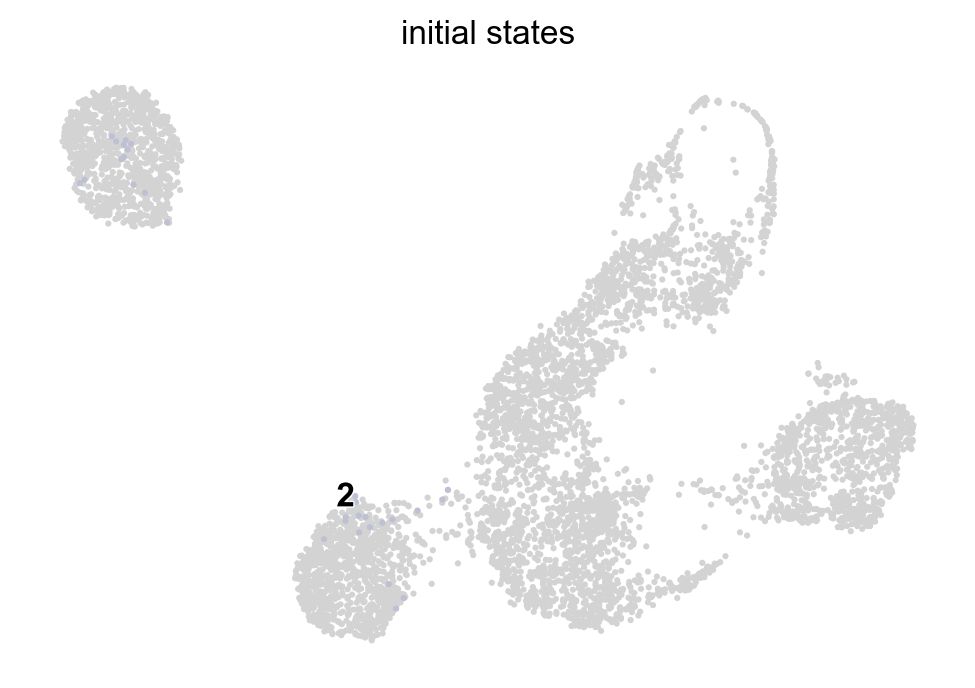

In [37]:
# Identify initial states
cr.tl.initial_states(adata, 
                     n_states = 1, 
                     cluster_key="clusters")
cr.pl.initial_states(adata, discrete=True)

In [35]:
adata.uns['iroot'] = np.flatnonzero(adata.obs['clusters']  == '4')[0]

/Users/jingkui.wang/anaconda3/envs/cellrank/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning: `cellrank.tl.lineages` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  


Computing absorption probabilities


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.34/s]


Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:01)


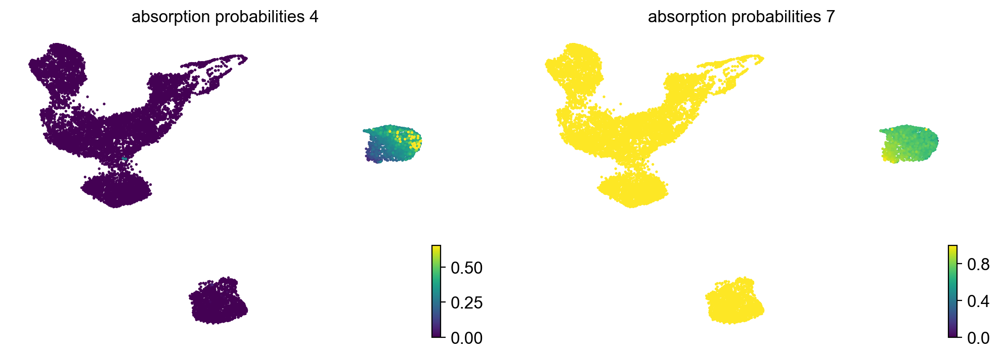

In [36]:
# Compute fate maps
cr.tl.lineages(adata)
cr.pl.lineages(adata, same_plot=False)

saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.5.to.d6_rm.weired.clusters/CellRank_fatemap_stochasticModel.pdf


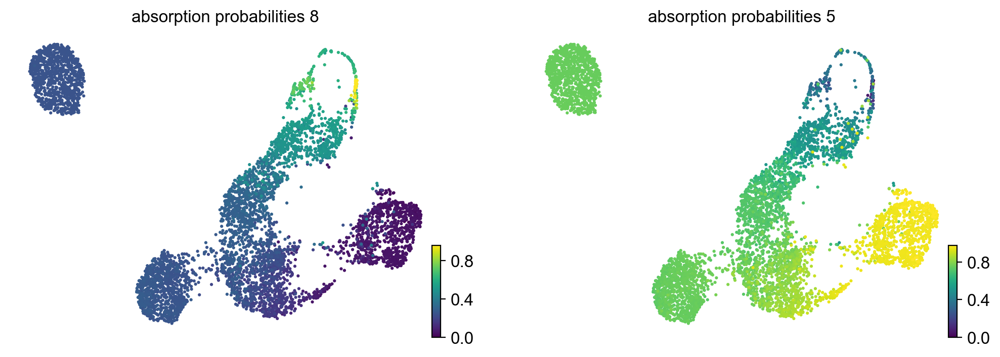

In [40]:
cr.pl.lineages(adata, same_plot=False, 
              save=os.path.join(input_Dir, "CellRank_fatemap_stochasticModel.pdf"))

In [45]:
cr.pl.log_odds(
    adata,
    lineage_1="5",
    lineage_2="10",
    time_key="time",
    keys=["condition"],
    threshold=0,
    size=2,
    xticks_step_size=4,
    figsize=(9, 4),
)

KeyError: "Invalid lineage name `10`. Valid names are: `['8', '5']`."

In [ ]:
#### manually set the terminal and initial states: 

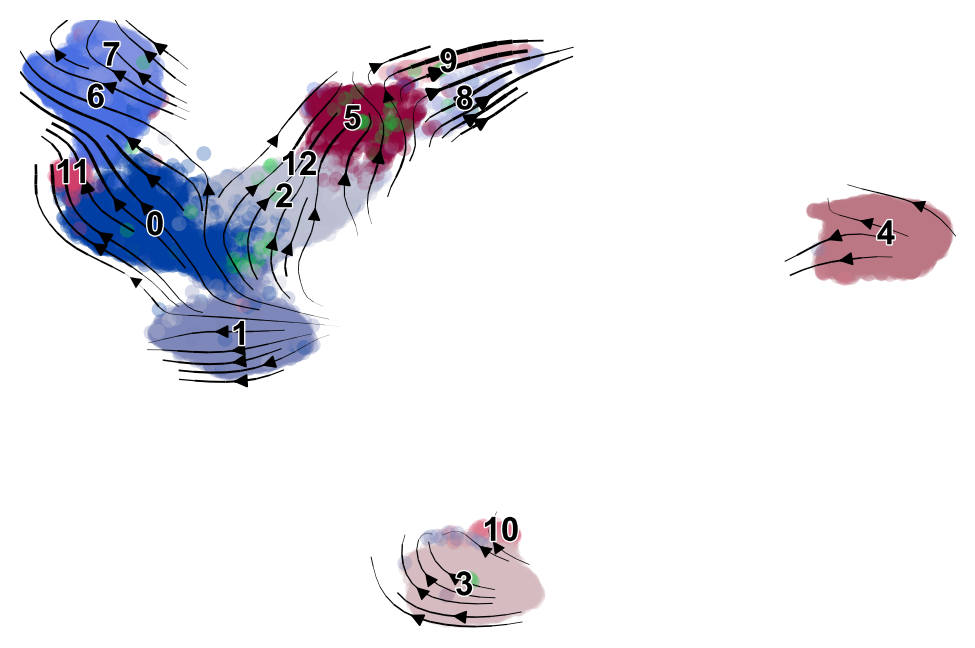

In [42]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "clusters"
)

In [41]:
adata.uns['iroot'] = np.flatnonzero(adata.obs['clusters']  == '4')[0]

In [ ]:
sc.tl.dpt(adata, n_branchings = 2)

saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.beforeRA.to.d6_rm.weired.clusters/scvelo_dpt_pseudotime.pdf


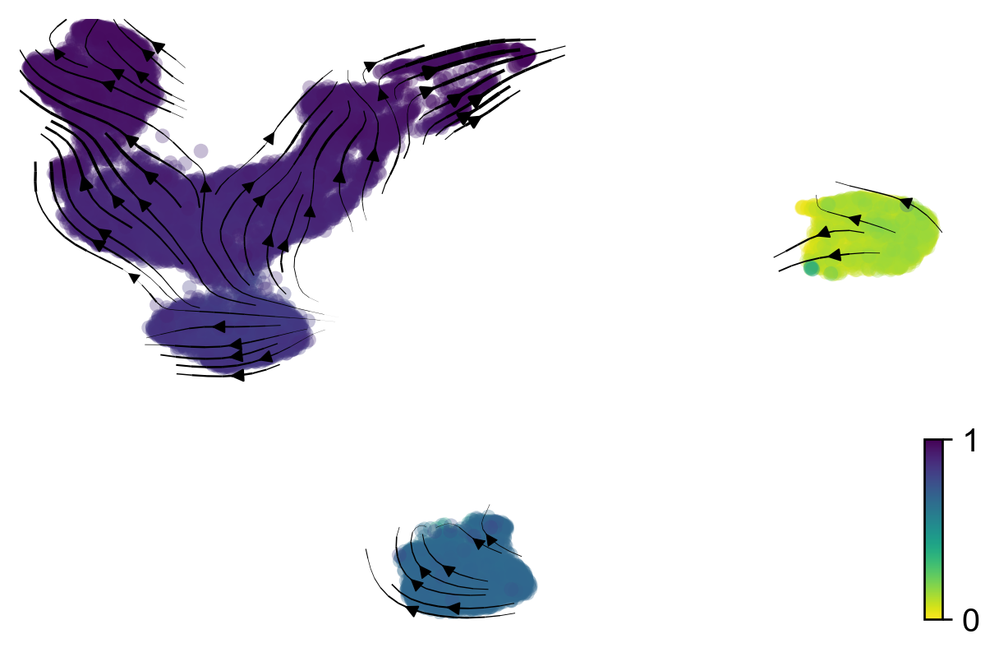

In [43]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "dpt_pseudotime",
    dpi = 120,
    save=os.path.join(outDir, "scvelo_dpt_pseudotime.pdf")
)

In [63]:
adata

AnnData object with n_obs × n_vars = 14000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'clusters_gradients', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'terminal_states', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likeli

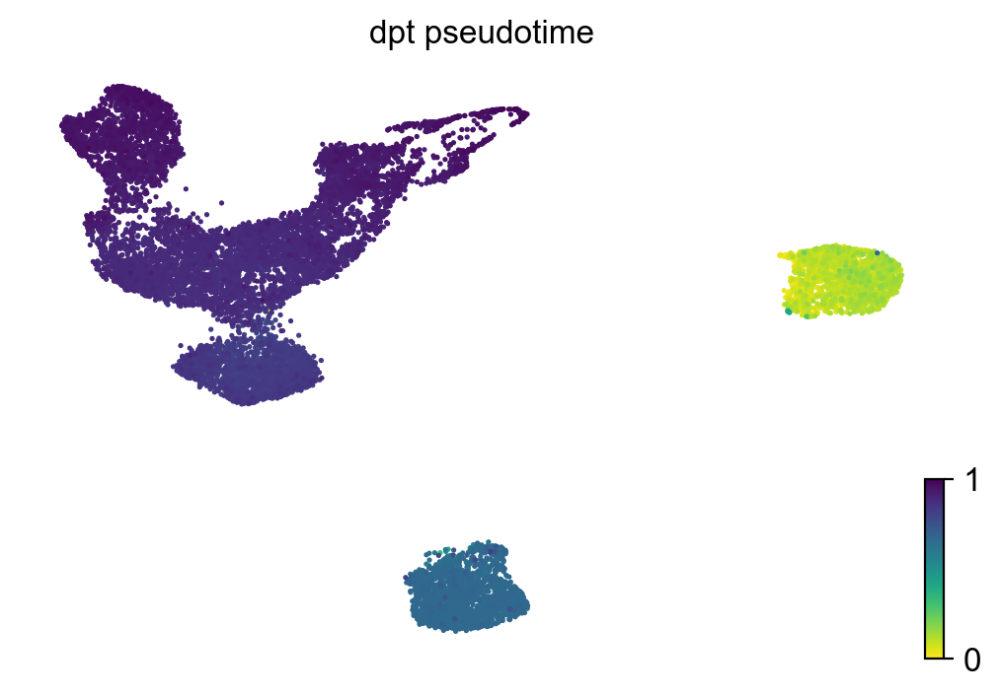

In [45]:
scv.pl.scatter(adata, basis="umap", c="dpt_pseudotime")

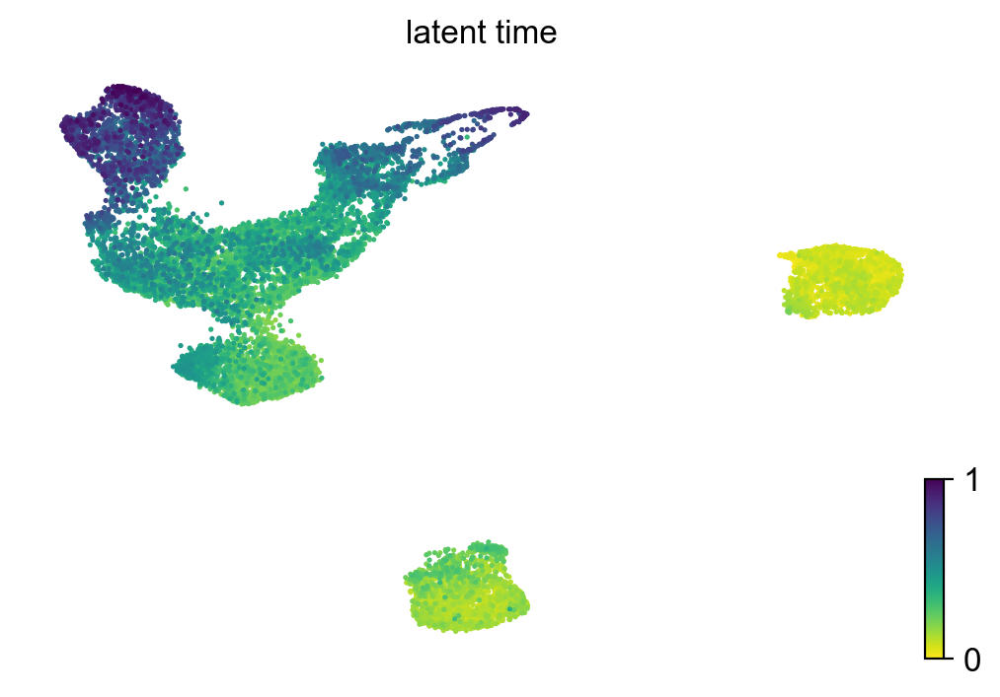

In [64]:
scv.pl.scatter(adata, basis="umap", c="latent_time")

In [46]:
from cellrank.tl.kernels import VelocityKernel
vk = VelocityKernel(adata)
pk = cr.tl.kernels.PseudotimeKernel(adata)

In [47]:
# Compute a transition matrix
pk.compute_transition_matrix()
vk.compute_transition_matrix()

Computing transition matrix based on `dpt_pseudotime`


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14000/14000 [00:02<00:00, 5930.18cell/s]
/Users/jingkui.wang/anaconda3/envs/cellrank/lib/python3.7/site-packages/cellrank/tl/_utils.py:719: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  G = nx.from_scipy_sparse_matrix(c) if issparse(c) else nx.from_numpy_array(c)


    Finish (0:00:06)
Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14000/14000 [01:39<00:00, 141.18cell/s]


Setting `softmax_scale=15.8728`


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14000/14000 [01:40<00:00, 139.72cell/s]

    Finish (0:03:21)


<VelocityKernel>

In [48]:
# Combining two kernels
from cellrank.tl.kernels import ConnectivityKernel
ck = ConnectivityKernel(adata).compute_transition_matrix()

Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)


In [49]:
combined_kernel = 0.5 * vk + 0.3 *pk + 0.2 * ck
#combined_kernel = 0.8 * vk + 0.2 * ck
#combined_kernel = 0.8 * vk + 0.2 * ck

In [50]:
# Initialize an estimator
from cellrank.tl.estimators import GPCCA

g = GPCCA(combined_kernel)
print(g)

GPCCA[n=14000, kernel=((0.5 * <VelocityKernel[softmax_scale=15.87, mode=deterministic, seed=33195, scheme=<CorrelationScheme>]>) + (0.3 * <PseudotimeKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>) + (0.2 * <ConnectivityKernel[dnorm=True, key=connectivities]>))]


Computing Schur decomposition
Mat Object: 1 MPI processes
  type: seqdense
9.9999999999999978e-01 1.7020590885366985e-03 7.3700186240771562e-03 9.0511002474023029e-03 8.5508357790979525e-03 -1.0142742247054939e-03 
0.0000000000000000e+00 9.9582847926559959e-01 4.1975916535958238e-03 7.1583970502881811e-03 2.8895115845336337e-03 -1.2728986550334964e-03 
0.0000000000000000e+00 0.0000000000000000e+00 9.9403155063337056e-01 -4.0127653278340652e-03 5.5766756029636847e-03 -1.0238784607138934e-02 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 9.8410448591216193e-01 2.3142756387207641e-02 -1.0303617581273775e-02 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 9.7738710146974883e-01 3.0285390218190392e-02 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 9.7075925310658762e-01 
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_ma

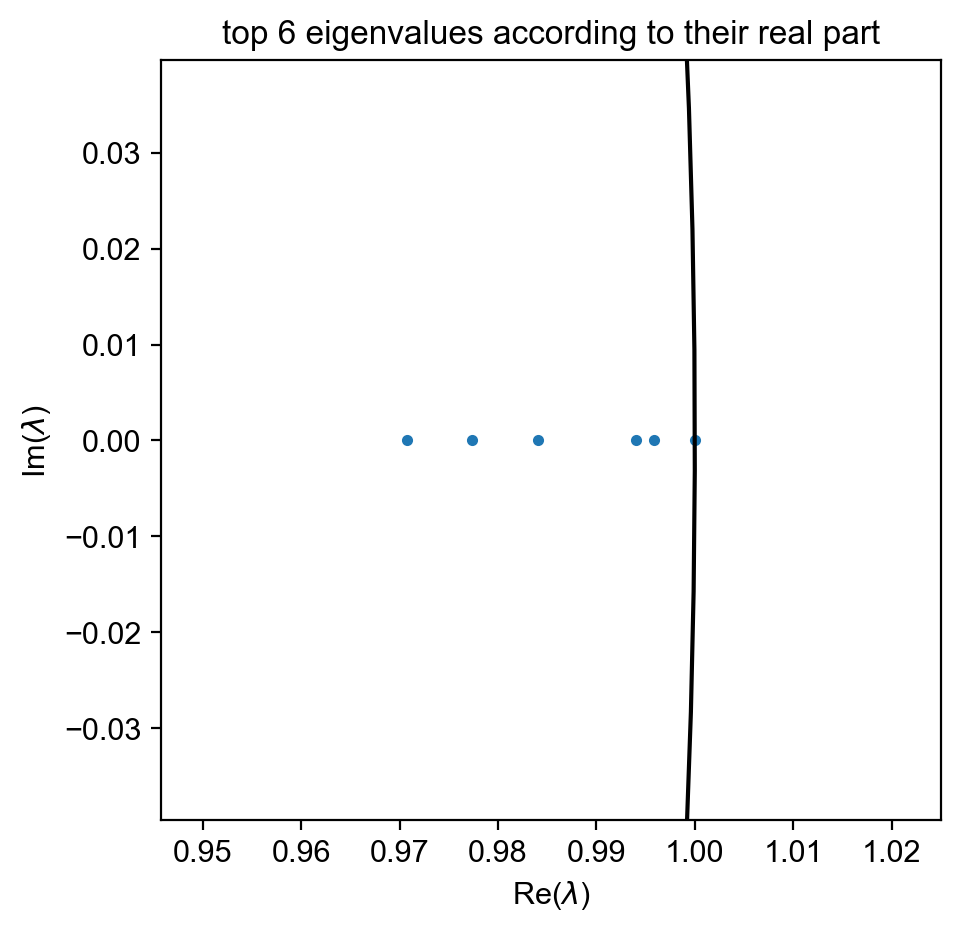

In [51]:
# Compute a matrix decomposition
g.compute_schur(n_components=6) # method with 'brandts', otherwise kernel will be killed; take really a long time for 40k cells 
g.plot_spectrum()

Computing `6` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:02)


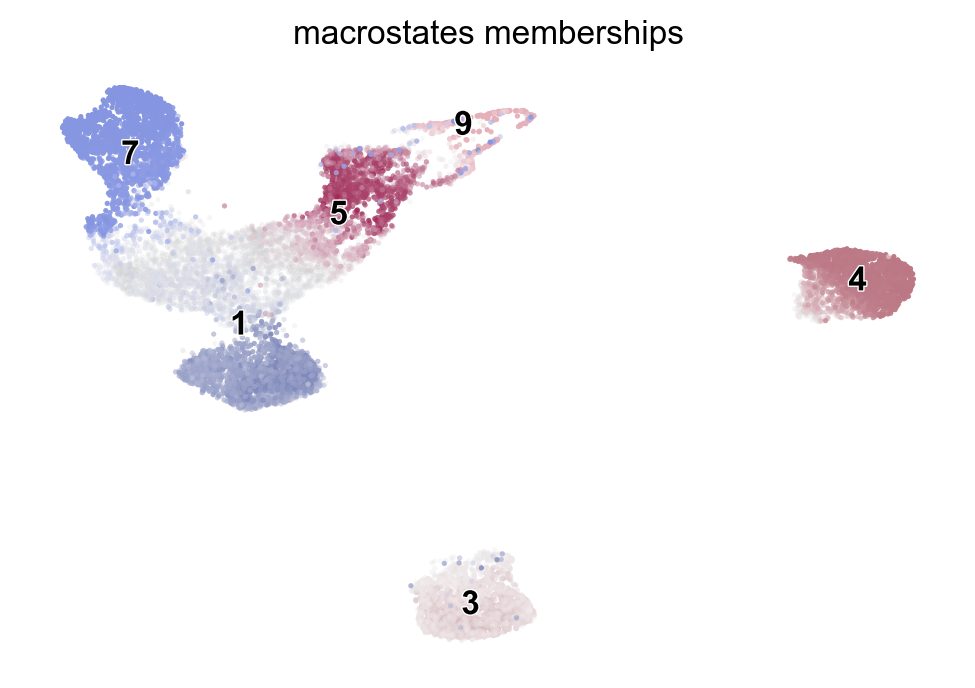

In [52]:
# Infer terminal states
g.compute_macrostates(n_states = 6, cluster_key="clusters")
g.plot_macrostates()

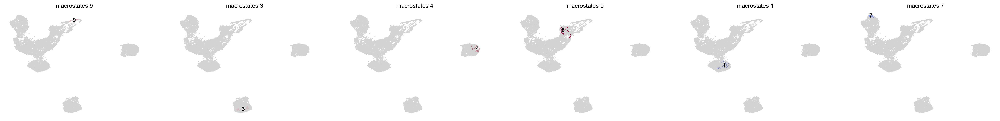

In [53]:
g.plot_macrostates(same_plot=False, discrete=True)

In [54]:
g.set_terminal_states({"Neurons": adata[adata.obs["clusters"] == "9"].obs_names}, add_to_existing=F)
g.set_terminal_states({"FP": adata[adata.obs["clusters"] == "7"].obs_names}, add_to_existing=True)


Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


In [55]:
g.compute_absorption_probabilities()

Computing absorption probabilities


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 12.73/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:00)


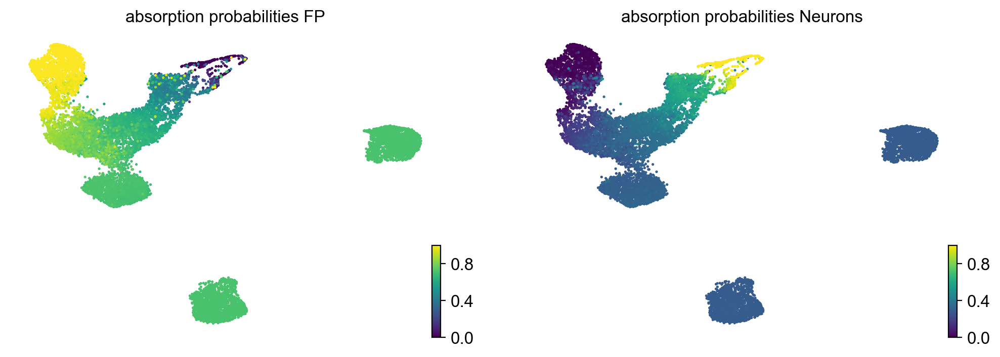

In [56]:
g.plot_absorption_probabilities(discrete = True, same_plot = False)

saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.beforeRA.to.d6_rm.weired.clusters/cellrank_absorption_probs_vk0.5_pk0.3_ck0.2.pdf


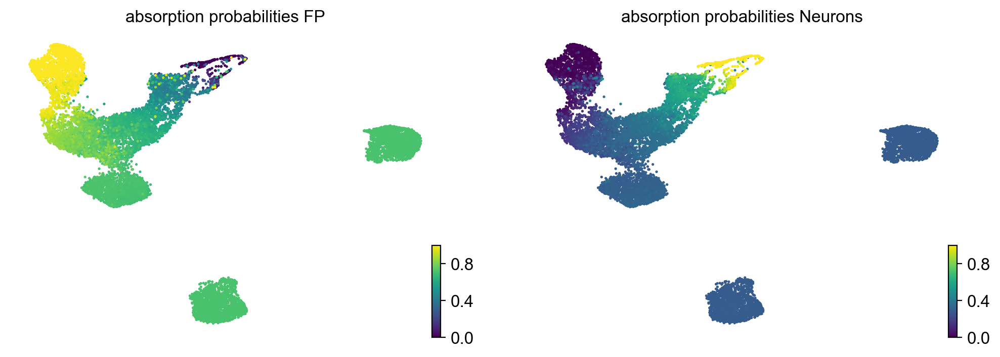

In [57]:
g.plot_absorption_probabilities(discrete = True, 
                                same_plot = False, 
                                save=os.path.join(outDir, "cellrank_absorption_probs_vk0.5_pk0.3_ck0.2.pdf"))

In [58]:
g

GPCCA[n=14000, kernel=((0.5 * <VelocityKernel>) + (0.3 * <PseudotimeKernel>) + (0.2 * <ConnectivityKernel>))]

In [59]:
adata

AnnData object with n_obs × n_vars = 14000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'clusters_gradients', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'terminal_states'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit

In [49]:
### Directed PAGA not used 

In [47]:
scv.tl.recover_latent_time(
    adata, root_key="initial_states_probs", end_key="terminal_states_probs"
)

computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


In [48]:
adata

AnnData object with n_obs × n_vars = 6000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'terminal_states', 'terminal_states_probs', 'clusters_gradients', 'initial_states', 'initial_states_probs', 'dpt_pseudotime', 'velocity_pseudotime', 'latent_time'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fi

saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.beforeRA.to.d6_rm.weired.clusters/scvelo_velocity_pseudotime.pdf


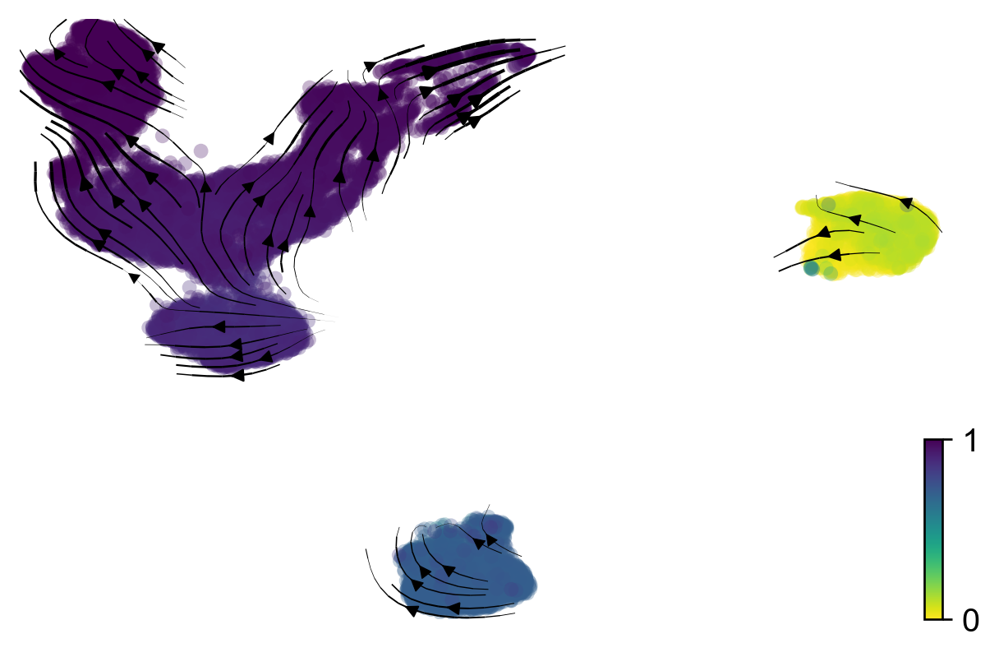

In [65]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "velocity_pseudotime",
    dpi = 120,
    save=os.path.join(outDir, "scvelo_velocity_pseudotime.pdf")
)

saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.beforeRA.to.d6_rm.weired.clusters/scvelo_dpt_pseudotime.pdf


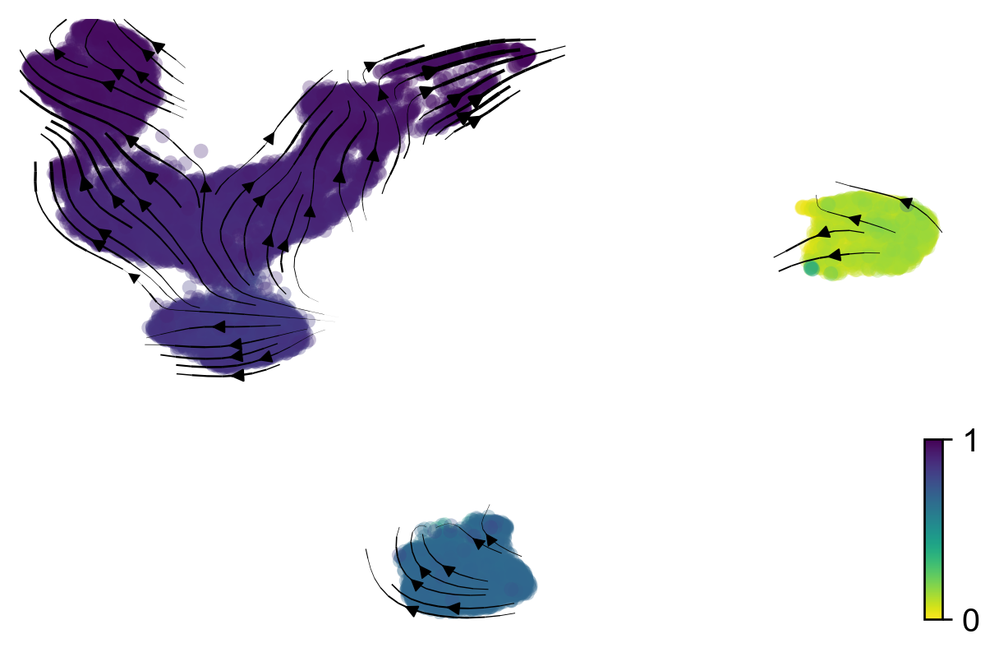

In [66]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "dpt_pseudotime",
    dpi = 120,
    save=os.path.join(outDir, "scvelo_dpt_pseudotime.pdf")
)

saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.beforeRA.to.d6_rm.weired.clusters/scvelo_latent_time.pdf


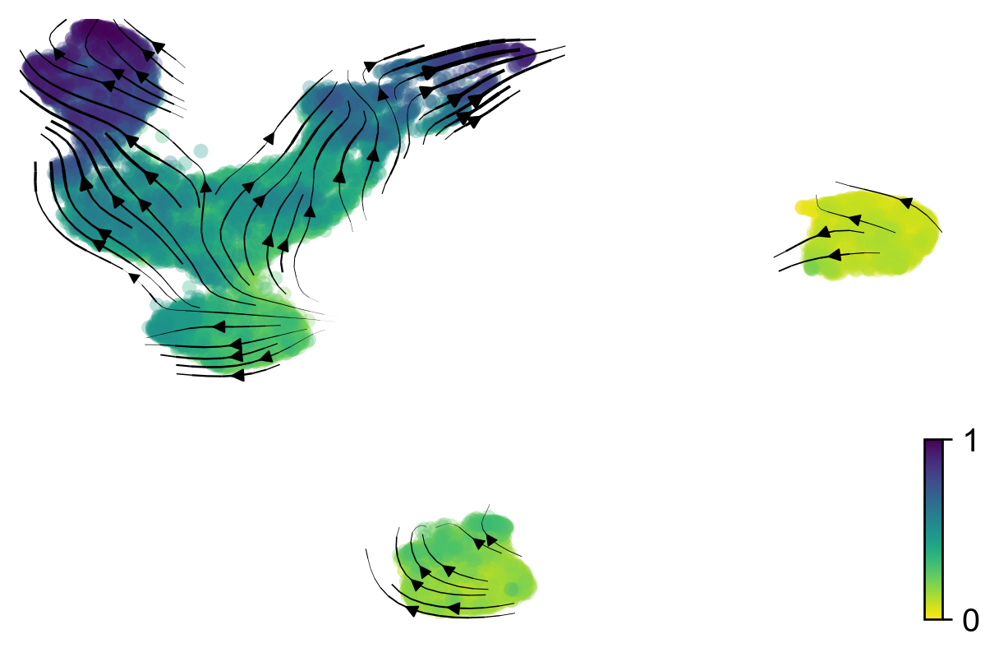

In [67]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "latent_time",
    dpi = 120,
    save=os.path.join(outDir, "scvelo_latent_time.pdf")
)

In [46]:
scv.tl.paga(
    adata,
    groups="condition",
    root_key="initial_states_probs",
    end_key="terminal_states_probs",
    use_time_prior="velocity_pseudotime",
)


running PAGA using priors: ['velocity_pseudotime', 'initial_states_probs', 'terminal_states_probs']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


/Users/jingkui.wang/anaconda3/envs/cellrank/lib/python3.7/site-packages/networkx/convert.py:157: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)


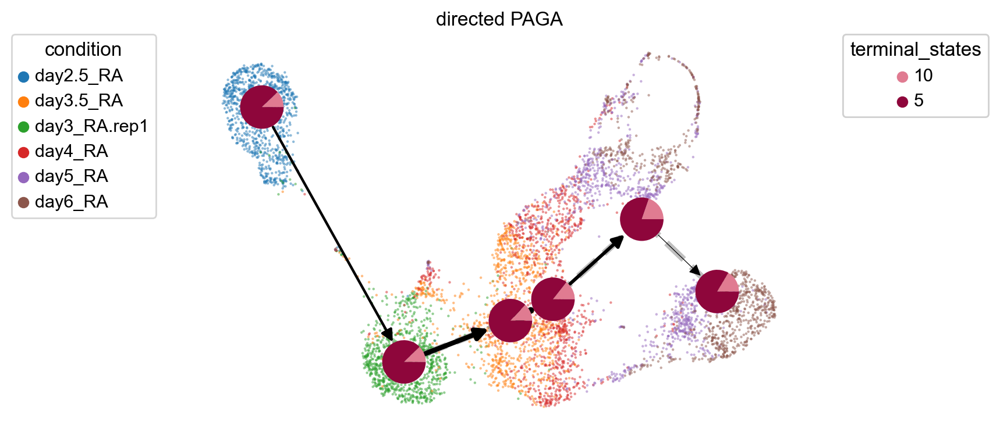

In [47]:
cr.pl.cluster_fates(
    adata,
    mode="paga_pie",
    cluster_key="condition",
    basis="umap",
    legend_kwargs={"loc": "top right out"},
    legend_loc="top left out",
    node_size_scale=5,
    edge_width_scale=1,
    max_edge_width=4,
    title="directed PAGA",
    save=os.path.join(input_Dir, "CellRank_PAGA_fateProb_condition_umapV3.pdf")
)


running PAGA using priors: ['velocity_pseudotime', 'initial_states_probs', 'terminal_states_probs']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


/Users/jingkui.wang/anaconda3/envs/cellrank/lib/python3.7/site-packages/networkx/convert.py:157: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)


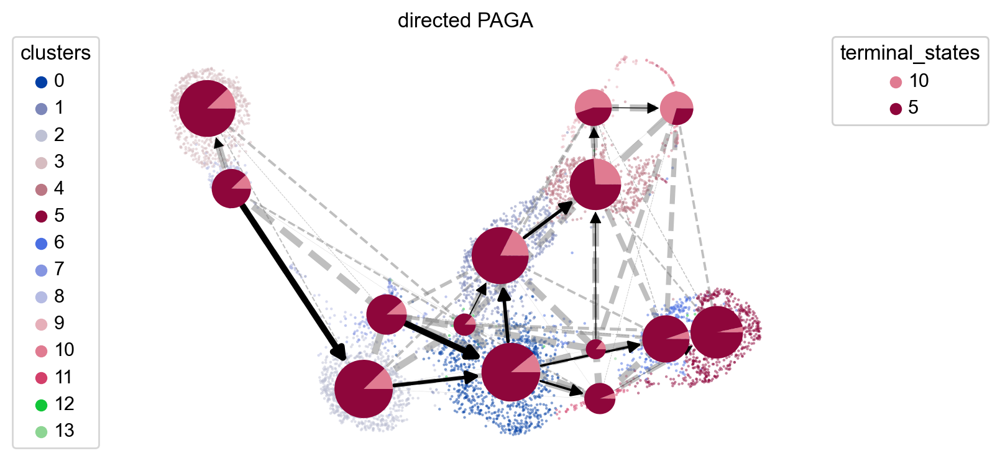

In [48]:
scv.tl.paga(
    adata,
    groups="clusters",
    root_key="initial_states_probs",
    end_key="terminal_states_probs",
    use_time_prior="velocity_pseudotime",
)
cr.pl.cluster_fates(
    adata,
    mode="paga_pie",
    cluster_key="clusters",
    basis="umap",
    legend_kwargs={"loc": "top right out"},
    legend_loc="top left out",
    node_size_scale=5,
    edge_width_scale=1,
    max_edge_width=4,
    title="directed PAGA",
    save=os.path.join(input_Dir, "CellRank_PAGA_fateProb_clusters_umapV3.pdf"),
)
